# **Object Detection with Detectron 2 using a Custom Dataset**

**Detectron2** is a research platform and a production library for object detection, built by **Facebook AI Research (FAIR)**.

It is completely written on PyTorch and is flexible and extensible, and able to provide fast training on single or multiple GPU servers. 

Also, it includes high-quality implementations of state-of-the-art object detection algorithms, including 
**DensePose**
, 
**panoptic feature pyramid network**s
, and numerous variants of the pioneering 
**Mask R-CNN**
model family also developed by FAIR. 

Its extensible design makes it easy to implement cutting-edge research projects without having to fork the entire codebase.


**In this notebook, we are going to deal with identifying the language of text using the Faster RCNN model from the Detectron 2's model zoo.**

We are going to limit our languages by 2.



We identify **Hindi** and **English** Text and we include a Single Class called **Others** for other languages.

You can download the dataset here: https://drive.google.com/file/d/1y7wYtTRgexQj4ZRtwjCtoFEPSblJiyKm/view?usp=sharing

Upload it either to your session storage or upload it to your drive and mount your drive to this notebook.





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#If you did upload the zip file to your session storage, use this command or else modify accordingly.
!ls
!unzip "/content/drive/MyDrive/DLProject/data.zip"

Streaming output truncated to the last 5000 lines.
  inflating: data/train/2015_01148.jpg  
  inflating: data/train/2015_01149.jpg  
  inflating: data/train/2015_01150.JPEG  
  inflating: data/train/2015_01151.JPEG  
  inflating: data/train/2015_01152.JPEG  
  inflating: data/train/2015_01153.JPEG  
 extracting: data/train/2015_01154.JPEG  
  inflating: data/train/2015_01155.JPEG  
  inflating: data/train/2015_01156.JPEG  
 extracting: data/train/2015_01157.JPEG  
  inflating: data/train/2015_01158.JPEG  
  inflating: data/train/2015_01159.JPEG  
  inflating: data/train/2015_01160.JPEG  
 extracting: data/train/2015_01161.JPEG  
  inflating: data/train/2015_01162.JPEG  
  inflating: data/train/2015_01163.JPEG  
  inflating: data/train/2015_01164.JPEG  
  inflating: data/train/2015_01165.JPEG  
  inflating: data/train/2015_01166.JPEG  
  inflating: data/train/2015_01167.JPEG  
  inflating: data/train/2015_01168.JPEG  
  inflating: data/train/2015_01169.JPEG  
  inflating: data/train/201

## **Install Dependencies**

Kickstart with installing a few dependencies such as Torch Vision and COCO API and check whether Cuda is available. Cuda helps in keeping track of the currently selected GPU.

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 22 kB/s 
     |████████████████████████████████| 6.6 MB 38.7 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 5.2 MB/s 
  Created wheel fo

## **Install Detectron2**

 And then install Detectron2

In [ ]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 988 kB/s 
     |████████████████████████████████| 50 kB 2.7 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220414-py3-none-any.whl size=61211 sha256=2cd0f6d3b83bea306b28f4c71d04f825132dd20c02390c3d88602d5a076d56ff
  Stored in directory: /root/.cache/pip/wheels/df/f4/b8/7b5df8b6722f4c72315ce70c31aa693e00cef6a5056149bd28
Successfully built fvcore


Import a few necessary packages.

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

## **Preparing and registering the Dataset**



There are different types for the format of bbox. It must be a member of structures.BoxMode.There are 5 such formats. But, currently it supports: **BoxMode.XYXY_ABS, BoxMode.XYWH_ABS**. We use the second format and mention the same in our dataset. After that, we need to register our datset.

In [ ]:
import glob
import os
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode

classes = {"0": "bicycle", "1" : "boat", "2" : "bottle" , "3" : "bus", "4":"car", "5":"cat" ,"6" : "chair" , "7":"cup","8":"dog","9":"motorbike","10":"people","11":"table"}
key_list = list(classes.keys())
val_list = list(classes.values())

def get_board_dicts(dir):
  txt_file_paths = glob.glob(dir +"/*.txt")
  dataset_dicts = []

  for i, file_path in enumerate(txt_file_paths):
      # get image size
    with open(file_path, "r") as f_o:
      lines = f_o.readlines()
      if '% bbGt version=3\n' in lines:
        lines.remove('% bbGt version=3\n')

      data = {}
      bboxes = []
      for line in lines:
        j = line.split(' ')
        box = {}
        if j != None and len(j) >= 4:
          box['bbox'] = [int(j[1]), int(j[2]), int(j[3]), int(j[4])]
          box['bbox_mode'] = BoxMode.XYWH_ABS
          box['category_id'] = int(key_list[val_list.index(j[0].lower())])
          bboxes.append(box)
      p = file_path.split('.')[0] + '.' + file_path.split('.')[1]
    
      if os.path.exists(p):
        img = cv2.imread(p)
        data['annotations'] = bboxes
        data['image_id'] = i
        data['file_name'] = p
        if img is not None:
          data['width'] = img.shape[1]
          data['height'] = img.shape[0]
    if len(data) == 5:
      dataset_dicts.append(data)
  return dataset_dicts

for d in ["train", "test"]:
  DatasetCatalog.register("boardetect_" + d, lambda d=d: get_board_dicts("exdark/" + d))
  MetadataCatalog.get("boardetect_" + d).set(thing_classes=val_list)
  board_metadata = MetadataCatalog.get("boardetect_train")


## **Visualizing the Training Dataset**

We'll now try to visualize the training dataset. We'll randomly pick 3 pictures from the train folder of our dataset and see how the bounding boxes look like.

In [ ]:
dataset_dicts = get_board_dicts("exdark/train")

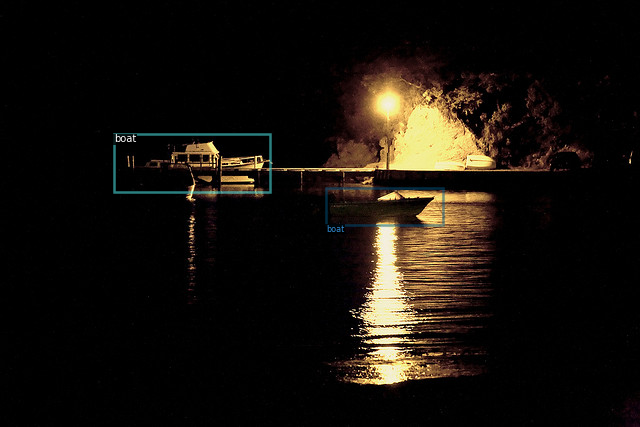

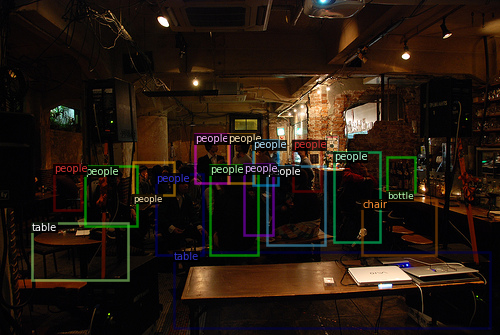

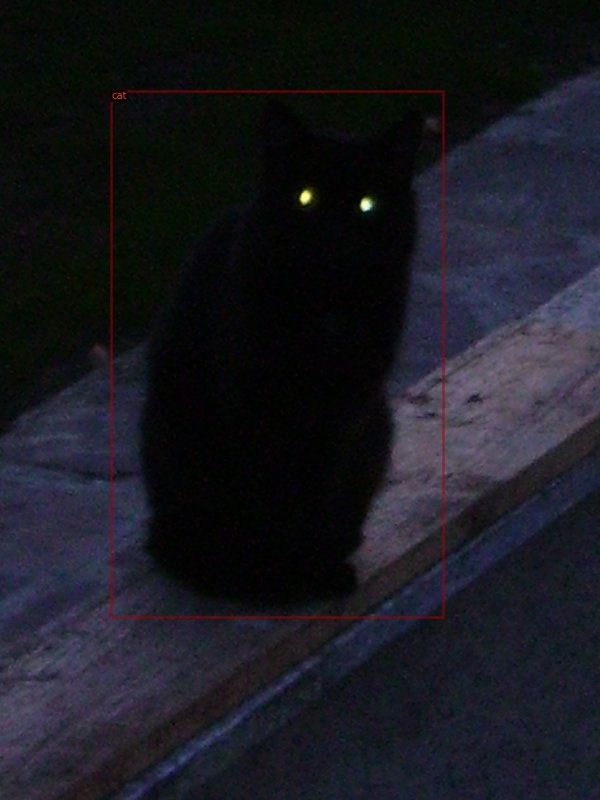

In [ ]:
for d in random.sample(dataset_dicts, 3):
  img = cv2.imread(d["file_name"])
  visualizer = Visualizer(img[:, :, ::-1], metadata=board_metadata)
  vis = visualizer.draw_dataset_dict(d)
  cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
len(dataset_dicts)

5878

## **Training the Faster R-CNN Model**

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

This is the step where we set the configuration for training. Everything related to hyperparameters and parameters related to normalization must be defined here.

We use the **"faster_rcnn_R_50_FPN_3x.yaml"** model from the model zoo of the Detectron2.

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("boardetect_train",)
cfg.DATASETS.TEST = ("boardetect_test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12 # No. of classes = [HINDI, ENGLISH, OTHER]
cfg.TEST.EVAL_PERIOD = 500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/17 01:48:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (13, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (13,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (48, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (48,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[04/17 01:49:53 d2.engine.train_loop]: Starting training from iteration 0
[04/17 01:50:13 d2.utils.events]:  eta: 0:24:23  iter: 19  total_loss: 2.853  loss_cls: 2.309  loss_box_reg: 0.458  loss_rpn_cls: 0.017  loss_rpn_loc: 0.016  time: 0.9837  data_time: 0.0450  lr: 0.000250  max_mem: 5441M
[04/17 01:50:35 d2.utils.events]:  eta: 0:25:23  iter: 39  total_loss: 1.378  loss_cls: 0.707  loss_box_reg: 0.564  loss_rpn_cls: 0.017  loss_rpn_loc: 0.020  time: 1.0329  data_time: 0.0256  lr: 0.000500  max_mem: 5441M
[04/17 01:50:55 d2.utils.events]:  eta: 0:24:39  iter: 59  total_loss: 1.247  loss_cls: 0.599  loss_box_reg: 0.593  loss_rpn_cls: 0.016  loss_rpn_loc: 0.013  time: 1.0260  data_time: 0.0204  lr: 0.000749  max_mem: 5441M
[04/17 01:51:15 d2.utils.events]:  eta: 0:24:12  iter: 79  total_loss: 0.983  loss_cls: 0.465  loss_box_reg: 0.516  loss_rpn_cls: 0.012  loss_rpn_loc: 0.014  time: 1.0206  data_time: 0.0222  lr: 0.000999  max_mem: 5441M
[04/17 01:51:35 d2.utils.events]:  eta: 0:23:5

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 282 had too many entries: 2, expected 1
  % (tag, len(values))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 283 had too many entries: 2, expected 1
  % (tag, len(values))


[04/17 02:20:39 d2.utils.events]:  eta: 0:01:02  iter: 1439  total_loss: 0.556  loss_cls: 0.237  loss_box_reg: 0.251  loss_rpn_cls: 0.018  loss_rpn_loc: 0.014  time: 1.0128  data_time: 0.0266  lr: 0.012500  max_mem: 5441M
[04/17 02:21:00 d2.utils.events]:  eta: 0:00:41  iter: 1459  total_loss: 0.635  loss_cls: 0.266  loss_box_reg: 0.317  loss_rpn_cls: 0.012  loss_rpn_loc: 0.016  time: 1.0133  data_time: 0.0219  lr: 0.012500  max_mem: 5441M
[04/17 02:21:21 d2.utils.events]:  eta: 0:00:21  iter: 1479  total_loss: 0.552  loss_cls: 0.229  loss_box_reg: 0.281  loss_rpn_cls: 0.011  loss_rpn_loc: 0.014  time: 1.0138  data_time: 0.0273  lr: 0.012500  max_mem: 5441M
[04/17 02:21:51 d2.data.common]: Serializing 1484 elements to byte tensors and concatenating them all ...
[04/17 02:21:51 d2.data.common]: Serialized dataset takes 0.39 MiB
[04/17 02:21:51 d2.evaluation.evaluator]: Start inference on 1484 images
[04/17 02:21:53 d2.evaluation.evaluator]: Inference done 11/1484. 0.1097 s / img. ETA=0:

Using this, you can analyze how your training was progressed over time. 

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## **Inference from the Validation Dataset using the trained model**

An output folder gets saved in the local storage in which the final weights are stored. You can save this folder for inferencing from this model in future.

Set the score threshold value for reducing the redundant boxes on the prediction results.

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set the testing threshold for this model
cfg.DATASETS.TEST = ("boardetect_test", )
predictor = DefaultPredictor(cfg)

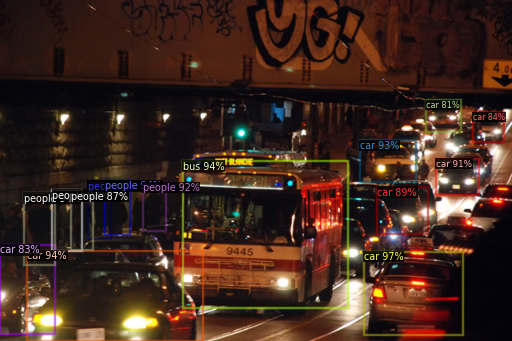

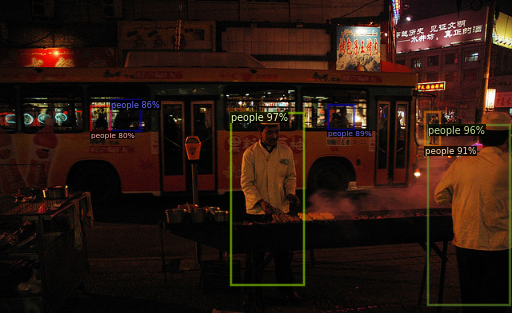

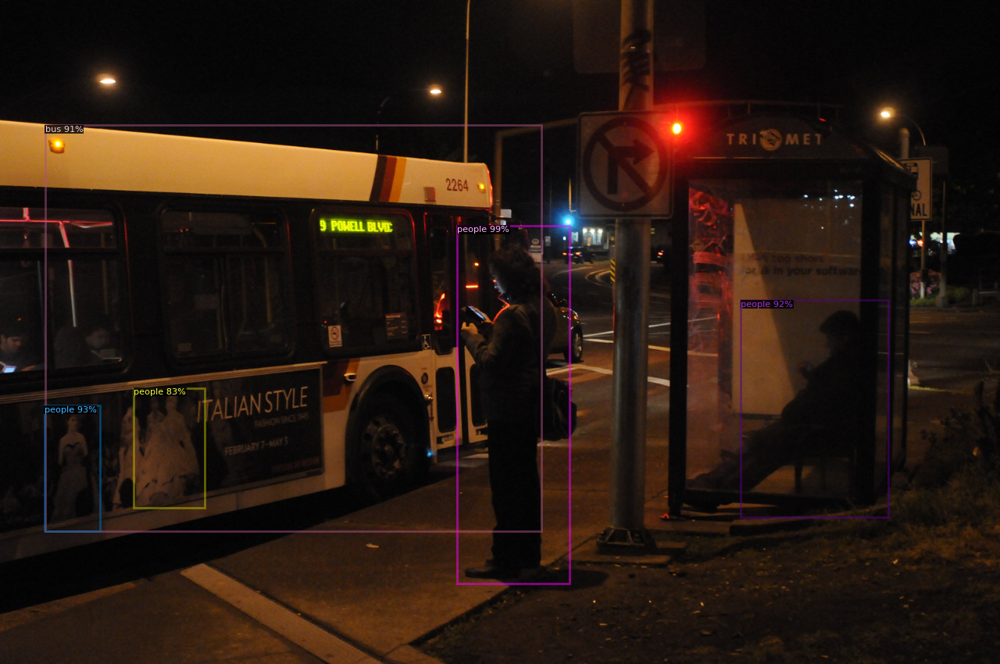

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_board_dicts("exdark/test")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=board_metadata, 
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

## **Evaluating the model**

Usually the model is evaluated following the COCO Standards of evaluation. Mean Average Precision (mAP) is used to evaluate the performance of the model.

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("boardetect_test", cfg, False, output_dir="/output/")
val_loader = build_detection_test_loader(cfg, "boardetect_test")
inference_on_dataset(predictor.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[04/17 02:26:48 d2.data.common]: Serializing 1484 elements to byte tensors and concatenating them all ...
[04/17 02:26:48 d2.data.common]: Serialized dataset takes 0.39 MiB
[04/17 02:26:48 d2.evaluation.evaluator]: Start inference on 1484 images
[04/17 02:26:49 d2.evaluation.evaluator]: Inference done 11/1484. 0.1066 s / img. ETA=0:02:38
[04/17 02:26:54 d2.evaluation.evaluator]: Inference done 56/1484. 0.1103 s / img. ETA=0:02:39
[04/17 02:26:59 d2.evaluation.evaluator]: Inference done 100/1484. 0.1113 s / img. ETA=0:02:36
[04/17 02:27:04 d2.evaluation.evaluator]: Inference done 144/1484. 0.1118 s / img. ETA=0:02:32
[04/17 02:27:09 d2.evaluation.evaluator]: Inference done 188/1484. 0.1119 s / img. ETA=0:02:27
[04/17 02:27:14 d2.evaluation.evaluator]: Inference done 232/1484. 0.1122 s / img. ETA=0:02:22
[04/17 02:27:19 d2.evaluation.evaluator]: Inference done 274/1484. 0.1130 s / img. ETA=0:02:18
[04/17 02:27:24 d2.evaluation.evaluator]: Inference done 316/1484. 0.1137 s / img. ETA=0:02

OrderedDict([('bbox',
              {'AP': 17.028082108068528,
               'AP-bicycle': 24.33895895314692,
               'AP-boat': 6.0763115249447885,
               'AP-bottle': 27.174111408699968,
               'AP-bus': 23.286707527720964,
               'AP-car': 28.422619328887322,
               'AP-cat': 2.4092409240924093,
               'AP-chair': 16.639214896223834,
               'AP-cup': 25.662959639993115,
               'AP-dog': 9.840283233332016,
               'AP-motorbike': 0.6930693069306929,
               'AP-people': 30.037718396736746,
               'AP-table': 9.755790156113568,
               'AP50': 32.486888786261574,
               'AP75': 16.382842099985456,
               'APl': 21.286797758982846,
               'APm': 13.474497340839747,
               'APs': 3.560423881523797})])

Fast RCNN

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/rpn_R_50_C4_1x.yaml"))
cfg.DATASETS.TRAIN = ("boardetect_train",)
cfg.DATASETS.TEST = ("boardetect_test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/rpn_R_50_C4_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12 # No. of classes = [HINDI, ENGLISH, OTHER]
cfg.TEST.EVAL_PERIOD = 500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/17 03:01:46 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_450694.pkl: 72.4MB [00:05, 13.1MB/s]                            


[04/17 03:03:28 d2.engine.train_loop]: Starting training from iteration 0
[04/17 03:03:54 d2.utils.events]:  eta: 0:31:21  iter: 19  total_loss: 0.192  loss_rpn_cls: 0.110  loss_rpn_loc: 0.084  time: 1.2709  data_time: 0.0548  lr: 0.000250  max_mem: 2465M
[04/17 03:04:19 d2.utils.events]:  eta: 0:31:15  iter: 39  total_loss: 0.154  loss_rpn_cls: 0.094  loss_rpn_loc: 0.063  time: 1.2777  data_time: 0.0343  lr: 0.000500  max_mem: 2465M
[04/17 03:04:46 d2.utils.events]:  eta: 0:30:55  iter: 59  total_loss: 0.161  loss_rpn_cls: 0.090  loss_rpn_loc: 0.066  time: 1.2893  data_time: 0.0302  lr: 0.000749  max_mem: 2465M
[04/17 03:05:12 d2.utils.events]:  eta: 0:30:48  iter: 79  total_loss: 0.181  loss_rpn_cls: 0.088  loss_rpn_loc: 0.087  time: 1.2969  data_time: 0.0264  lr: 0.000999  max_mem: 2465M
[04/17 03:05:38 d2.utils.events]:  eta: 0:30:27  iter: 99  total_loss: 0.180  loss_rpn_cls: 0.090  loss_rpn_loc: 0.074  time: 1.2968  data_time: 0.0286  lr: 0.001249  max_mem: 2465M
[04/17 03:06:04 

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 282 had too many entries: 2, expected 1
  % (tag, len(values))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 283 had too many entries: 2, expected 1
  % (tag, len(values))


[04/17 03:41:09 d2.utils.events]:  eta: 0:04:50  iter: 1279  total_loss: 0.229  loss_rpn_cls: 0.157  loss_rpn_loc: 0.092  time: 1.3096  data_time: 0.0238  lr: 0.012500  max_mem: 2465M
[04/17 03:41:35 d2.utils.events]:  eta: 0:04:24  iter: 1299  total_loss: 0.221  loss_rpn_cls: 0.136  loss_rpn_loc: 0.087  time: 1.3096  data_time: 0.0251  lr: 0.012500  max_mem: 2465M
[04/17 03:42:01 d2.utils.events]:  eta: 0:03:57  iter: 1319  total_loss: 0.202  loss_rpn_cls: 0.107  loss_rpn_loc: 0.083  time: 1.3095  data_time: 0.0309  lr: 0.012500  max_mem: 2465M
[04/17 03:42:27 d2.utils.events]:  eta: 0:03:31  iter: 1339  total_loss: 0.212  loss_rpn_cls: 0.130  loss_rpn_loc: 0.085  time: 1.3089  data_time: 0.0294  lr: 0.012500  max_mem: 2465M
[04/17 03:42:53 d2.utils.events]:  eta: 0:03:04  iter: 1359  total_loss: 0.214  loss_rpn_cls: 0.125  loss_rpn_loc: 0.074  time: 1.3087  data_time: 0.0280  lr: 0.012500  max_mem: 2465M
[04/17 03:43:19 d2.utils.events]:  eta: 0:02:38  iter: 1379  total_loss: 0.196  

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set the testing threshold for this model
cfg.DATASETS.TEST = ("boardetect_test", )
predictor = DefaultPredictor(cfg)


Skip loading parameter 'proposal_generator.anchor_generator.cell_anchors.0' to the model due to incompatible shapes: (15, 4) in the checkpoint but (3, 4) in the model! You might want to double check if this is expected.
Skip loading parameter 'proposal_generator.rpn_head.conv.weight' to the model due to incompatible shapes: (1024, 1024, 3, 3) in the checkpoint but (256, 256, 3, 3) in the model! You might want to double check if this is expected.
Skip loading parameter 'proposal_generator.rpn_head.conv.bias' to the model due to incompatible shapes: (1024,) in the checkpoint but (256,) in the model! You might want to double check if this is expected.
Skip loading parameter 'proposal_generator.rpn_head.objectness_logits.weight' to the model due to incompatible shapes: (15, 1024, 1, 1) in the checkpoint but (3, 256, 1, 1) in the model! You might want to double check if this is expected.
Skip loading parameter 'proposal_generator.rpn_head.objectness_logits.bias' to the model due to incompat

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_board_dicts("exdark/test")

In [ ]:
for d in random.sample(dataset_dicts, 3): 
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=board_metadata, 
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels
    )
    # print(outputs.keys())
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

{'proposals': Instances(num_instances=28, image_height=333, image_width=515, fields=[proposal_boxes: Boxes(tensor([[178.2902, 238.8419, 178.3970, 333.0000],
        [  0.0000,   0.0000, 515.0000, 333.0000],
        [343.2244, 320.9769, 343.3399, 333.0000],
        [  0.0000, 174.8789, 515.0000, 333.0000],
        [373.3297,   0.0000, 515.0000, 333.0000],
        [  0.0000,   0.0000, 515.0000, 333.0000],
        [264.8067,   0.0000, 515.0000, 333.0000],
        [  0.0000, 302.9033, 515.0000, 333.0000],
        [  0.0000, 273.9337, 515.0000, 333.0000],
        [493.4913,   0.0000, 515.0000, 333.0000],
        [  0.0000, 228.5658, 515.0000, 333.0000],
        [146.3397, 313.9966, 515.0000, 333.0000],
        [171.7472,  48.2183, 515.0000, 333.0000],
        [458.7107,   0.0000, 515.0000, 333.0000],
        [  0.0000, 324.2415, 515.0000, 333.0000],
        [  0.0000, 101.5802, 515.0000, 333.0000],
        [  0.0000, 167.9922, 515.0000, 333.0000],
        [402.9111, 222.2545, 515.0000, 333.

KeyError: ignored

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("boardetect_test", cfg, False, output_dir="/output/")
val_loader = build_detection_test_loader(cfg, "boardetect_test")
inference_on_dataset(predictor.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[04/17 03:52:47 d2.data.common]: Serializing 1484 elements to byte tensors and concatenating them all ...
[04/17 03:52:47 d2.data.common]: Serialized dataset takes 0.39 MiB
[04/17 03:52:47 d2.evaluation.evaluator]: Start inference on 1484 images
[04/17 03:52:50 d2.evaluation.evaluator]: Inference done 11/1484. 0.1732 s / img. ETA=0:04:18
[04/17 03:52:55 d2.evaluation.evaluator]: Inference done 41/1484. 0.1696 s / img. ETA=0:04:07
[04/17 03:53:00 d2.evaluation.evaluator]: Inference done 70/1484. 0.1722 s / img. ETA=0:04:06
[04/17 03:53:05 d2.evaluation.evaluator]: Inference done 99/1484. 0.1717 s / img. ETA=0:04:00
[04/17 03:53:11 d2.evaluation.evaluator]: Inference done 128/1484. 0.1725 s / img. ETA=0:03:56
[04/17 03:53:16 d2.evaluation.evaluator]: Inference done 156/1484. 0.1735 s / img. ETA=0:03:53
[04/17 03:53:21 d2.evaluation.evaluator]: Inference done 186/1484. 0.1729 s / img. ETA=0:03:47
[04/17 03:53:26 d2.evaluation.evaluator]: Inference done 216/1484. 0.1722 s / img. ETA=0:03:4

OrderedDict([('box_proposals',
              {'AR@100': 36.4328533411026,
               'AR@1000': 51.61738395690918,
               'ARl@100': 43.46492886543274,
               'ARl@1000': 55.06324768066406,
               'ARm@100': 30.726850032806396,
               'ARm@1000': 49.53240752220154,
               'ARs@100': 21.547910571098328,
               'ARs@1000': 40.466827154159546})])

FAST RCNN R50 fPN

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/rpn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("boardetect_train",)
cfg.DATASETS.TEST = ("boardetect_test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/rpn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12 # No. of classes = [HINDI, ENGLISH, OTHER]
cfg.TEST.EVAL_PERIOD = 500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/17 14:20:34 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_02ce48.pkl: 110MB [00:02, 49.2MB/s]                           


[04/17 14:22:11 d2.engine.train_loop]: Starting training from iteration 0
[04/17 14:22:59 d2.utils.events]:  eta: 1:00:06  iter: 19  total_loss: 0.056  loss_rpn_cls: 0.038  loss_rpn_loc: 0.022  time: 2.4293  data_time: 0.0491  lr: 0.000250  max_mem: 4532M
[04/17 14:23:49 d2.utils.events]:  eta: 1:00:55  iter: 39  total_loss: 0.042  loss_rpn_cls: 0.020  loss_rpn_loc: 0.017  time: 2.4734  data_time: 0.0297  lr: 0.000500  max_mem: 4532M
[04/17 14:24:41 d2.utils.events]:  eta: 1:00:35  iter: 59  total_loss: 0.048  loss_rpn_cls: 0.026  loss_rpn_loc: 0.021  time: 2.5144  data_time: 0.0229  lr: 0.000749  max_mem: 4532M
[04/17 14:25:32 d2.utils.events]:  eta: 0:59:55  iter: 79  total_loss: 0.033  loss_rpn_cls: 0.017  loss_rpn_loc: 0.018  time: 2.5276  data_time: 0.0236  lr: 0.000999  max_mem: 4532M
[04/17 14:26:21 d2.utils.events]:  eta: 0:58:40  iter: 99  total_loss: 0.030  loss_rpn_cls: 0.014  loss_rpn_loc: 0.013  time: 2.5071  data_time: 0.0351  lr: 0.001249  max_mem: 4532M
[04/17 14:27:11 

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 282 had too many entries: 2, expected 1
  % (tag, len(values))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 283 had too many entries: 2, expected 1
  % (tag, len(values))


[04/17 15:30:40 d2.utils.events]:  eta: 0:09:09  iter: 1279  total_loss: 0.038  loss_rpn_cls: 0.017  loss_rpn_loc: 0.020  time: 2.4783  data_time: 0.0242  lr: 0.012500  max_mem: 4532M
[04/17 15:31:30 d2.utils.events]:  eta: 0:08:19  iter: 1299  total_loss: 0.035  loss_rpn_cls: 0.013  loss_rpn_loc: 0.018  time: 2.4789  data_time: 0.0351  lr: 0.012500  max_mem: 4532M
[04/17 15:32:20 d2.utils.events]:  eta: 0:07:29  iter: 1319  total_loss: 0.026  loss_rpn_cls: 0.015  loss_rpn_loc: 0.016  time: 2.4790  data_time: 0.0202  lr: 0.012500  max_mem: 4532M
[04/17 15:33:10 d2.utils.events]:  eta: 0:06:40  iter: 1339  total_loss: 0.026  loss_rpn_cls: 0.014  loss_rpn_loc: 0.013  time: 2.4795  data_time: 0.0290  lr: 0.012500  max_mem: 4532M
[04/17 15:34:01 d2.utils.events]:  eta: 0:05:50  iter: 1359  total_loss: 0.032  loss_rpn_cls: 0.013  loss_rpn_loc: 0.019  time: 2.4801  data_time: 0.0236  lr: 0.012500  max_mem: 4532M
[04/17 15:34:50 d2.utils.events]:  eta: 0:05:00  iter: 1379  total_loss: 0.036  

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0  # set the testing threshold for this model
cfg.DATASETS.TEST = ("boardetect_test", )
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_board_dicts("exdark/test")

In [ ]:
for d in random.sample(dataset_dicts, 3): 
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=board_metadata, 
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels
    )
    print(outputs.keys())
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

{'proposals': Instances(num_instances=1547, image_height=480, image_width=640, fields=[proposal_boxes: Boxes(tensor([[548.7950, 321.7944, 591.0596, 361.3750],
        [147.9752, 343.6847, 177.7811, 403.8035],
        [551.3160, 316.8451, 589.0961, 353.7827],
        ...,
        [ 15.7735,   0.0000, 172.6246,  15.1195],
        [192.5723,   0.0000, 370.0245,  14.6377],
        [151.1658,   0.0000, 331.3804,  16.6771]], device='cuda:0')), objectness_logits: tensor([ 6.5458,  4.6242,  4.4347,  ..., -9.5079, -9.5469, -9.5700],
       device='cuda:0')])}
dict_keys(['proposals'])


KeyError: ignored

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("boardetect_test", cfg, False, output_dir="/output/")
val_loader = build_detection_test_loader(cfg, "boardetect_test")
inference_on_dataset(predictor.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[04/17 15:49:14 d2.data.common]: Serializing 1484 elements to byte tensors and concatenating them all ...
[04/17 15:49:14 d2.data.common]: Serialized dataset takes 0.39 MiB
[04/17 15:49:14 d2.evaluation.evaluator]: Start inference on 1484 images
[04/17 15:49:18 d2.evaluation.evaluator]: Inference done 11/1484. 0.2839 s / img. ETA=0:07:00
[04/17 15:49:23 d2.evaluation.evaluator]: Inference done 29/1484. 0.2800 s / img. ETA=0:06:50
[04/17 15:49:28 d2.evaluation.evaluator]: Inference done 46/1484. 0.2903 s / img. ETA=0:07:00
[04/17 15:49:33 d2.evaluation.evaluator]: Inference done 63/1484. 0.2928 s / img. ETA=0:06:59
[04/17 15:49:38 d2.evaluation.evaluator]: Inference done 80/1484. 0.2943 s / img. ETA=0:06:56
[04/17 15:49:43 d2.evaluation.evaluator]: Inference done 98/1484. 0.2913 s / img. ETA=0:06:46
[04/17 15:49:48 d2.evaluation.evaluator]: Inference done 115/1484. 0.2917 s / img. ETA=0:06:42
[04/17 15:49:53 d2.evaluation.evaluator]: Inference done 132/1484. 0.2921 s / img. ETA=0:06:38


OrderedDict([('box_proposals',
              {'AR@100': 50.66859722137451,
               'AR@1000': 60.09469032287598,
               'ARl@100': 55.262553691864014,
               'ARl@1000': 61.10004782676697,
               'ARm@100': 47.675928473472595,
               'ARm@1000': 59.74074602127075,
               'ARs@100': 36.97788417339325,
               'ARs@1000': 55.45454025268555})])

Faster RCNN X101

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("boardetect_train",)
cfg.DATASETS.TEST = ("boardetect_test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12 # No. of classes = [HINDI, ENGLISH, OTHER]
cfg.TEST.EVAL_PERIOD = 500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

NameError: ignored